# Data Handling:

### Imports

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.image as mpimg
import seaborn as sns
%matplotlib inline
import contextily as cx


In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore")

### DF Meta Data

In [2]:
df_meta = pd.read_csv('./nasa_data/meta/cyprus_2022_meta.csv')
print(df_meta.shape)
df_meta.head()

(4277, 11)


,ID,FIELD_ID,APPLICANT_ID,CROP_CODE,CROP_NAME,CROP_FAMILY,AREA,N_PIXELS,DATASET,N_IMAGES,STREET_LEVEL_IMAGES
0,1,01014-3101-/2-288-375-11-473-1,1014,3.0,WHEAT,CEREAL,1165.158305,20,TRAIN,2,"['550954009799519', '163131462849398']"
1,2,01014-3101-/2-288-375-11-507-1,1014,3.0,WHEAT,CEREAL,4545.289693,10,TRAIN,4,"['574767340699898', '808899540093076', '690113..."
2,3,01014-3101-/2-288-375-11-508-1,1014,3.0,WHEAT,CEREAL,2323.748449,20,TRAIN,3,"['749294869551510', '180587380975671', '757371..."
3,4,01014-3101-/2-289-375-11-509-1,1014,3.0,WHEAT,CEREAL,1471.295178,20,TRAIN,2,"['502164218257808', '716572983012265']"
4,5,01025-3101-33/55E2--789-2,1025,8.0,POTATOES,BROADLEAF CROPS,8189.480106,20,TRAIN,2,"['762920785018564', '621126086242482']"


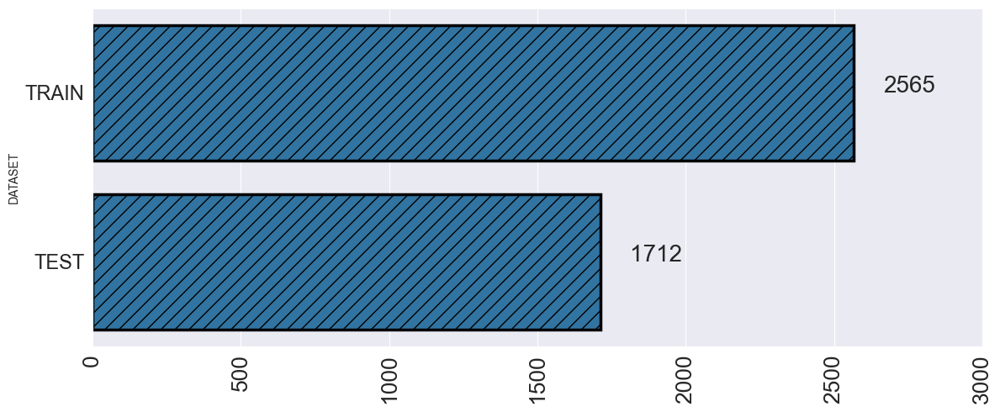

In [3]:
# d_count = df_meta.DATASET.value_counts().copy()
d_count = df_meta['DATASET'].value_counts().copy()


fig, ax = plt.subplots(figsize=(12,5))

ax_1 = sns.barplot(x=d_count.values,y=d_count.index,ax=ax,edgecolor="black", linewidth=2.5,hatch='//')
ax.set_title('',size=28)
ax.tick_params(axis='both', which='major', labelsize=17)
for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_width()), (p.get_width()+100, p.get_y()+0.4),
                         size=20, rotation = 0)
ax.set_xlim(0,3000)


ax_1.set_xticklabels(ax_1.get_xticklabels(), rotation=90,size=19)
plt.tight_layout()
plt.show()

In [4]:
print(df_meta.columns)

Index(['ID', 'FIELD_ID', 'APPLICANT_ID', 'CROP_CODE', 'CROP_NAME',
       'CROP_FAMILY', 'AREA', 'N_PIXELS', 'DATASET', 'N_IMAGES',
       'STREET_LEVEL_IMAGES'],
      dtype='object')


In [5]:
## Fill NaN values
df_meta.CROP_NAME.fillna('TEST',inplace=True)
df_meta.CROP_CODE.fillna(0,inplace=True)

### DBF Meta Data

In [6]:
## import shapefile (geospatial vector data analysis)
dbf_meta = gpd.GeoDataFrame.from_file(filename='./nasa_data/meta/cyprus_2022_meta.shp',driver='ESRI Shapefile')
print(dbf_meta.shape)
dbf_meta.head()

(4277, 8)


,ID,FIELD_ID,APPLICANT_,CROP_CODE,CROP_NAME,CROP_FAMIL,AREA,geometry
0,1,01014-3101-/2-288-375-11-473-1,01014,3.0,WHEAT,CEREAL,1165.158305,"POLYGON ((3781889.714 4164450.343, 3781890.735..."
1,2,01014-3101-/2-288-375-11-507-1,01014,3.0,WHEAT,CEREAL,4545.289693,"POLYGON ((3781942.116 4164424.232, 3781942.183..."
2,3,01014-3101-/2-288-375-11-508-1,01014,3.0,WHEAT,CEREAL,2323.748449,"POLYGON ((3782031.106 4164406.033, 3782039.856..."
3,4,01014-3101-/2-289-375-11-509-1,01014,3.0,WHEAT,CEREAL,1471.295178,"POLYGON ((3782094.923 4164394.288, 3782095.871..."
4,5,01025-3101-33/55E2--789-2,01025,8.0,POTATOES,BROADLEAF CROPS,8189.480106,"POLYGON ((3787404.962 4168881.273, 3787441.298..."


In [7]:
## fill NaN values
dbf_meta.CROP_NAME.fillna('TEST',inplace=True)
dbf_meta.CROP_CODE.fillna(0,inplace=True)

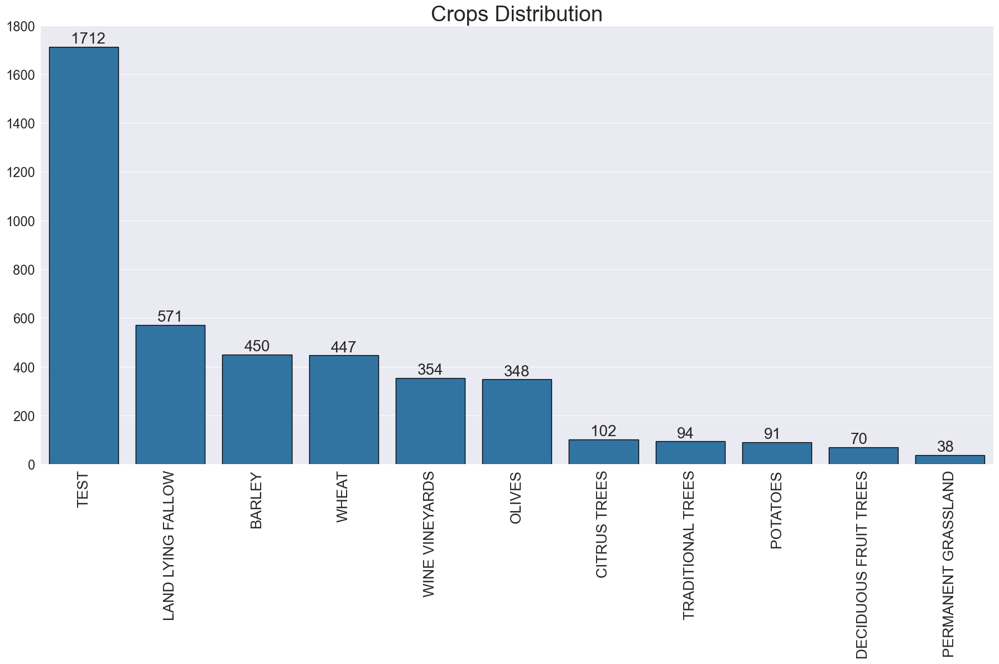

In [8]:
fig, ax = plt.subplots(figsize=(18, 12))

ax_1 = sns.countplot(x='CROP_NAME', data=dbf_meta, order = dbf_meta['CROP_NAME'].value_counts().index,
                     ax=ax,edgecolor="black", linewidth=1)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Crops Distribution',size=28)
ax.tick_params(axis='y', which='major', labelsize=17)
for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+15),
                         size=20, rotation = 0)
ax.set_ylim(0,1800)


ax_1.set_xticklabels(ax_1.get_xticklabels(), rotation=90,size=19)
plt.tight_layout()
plt.show()

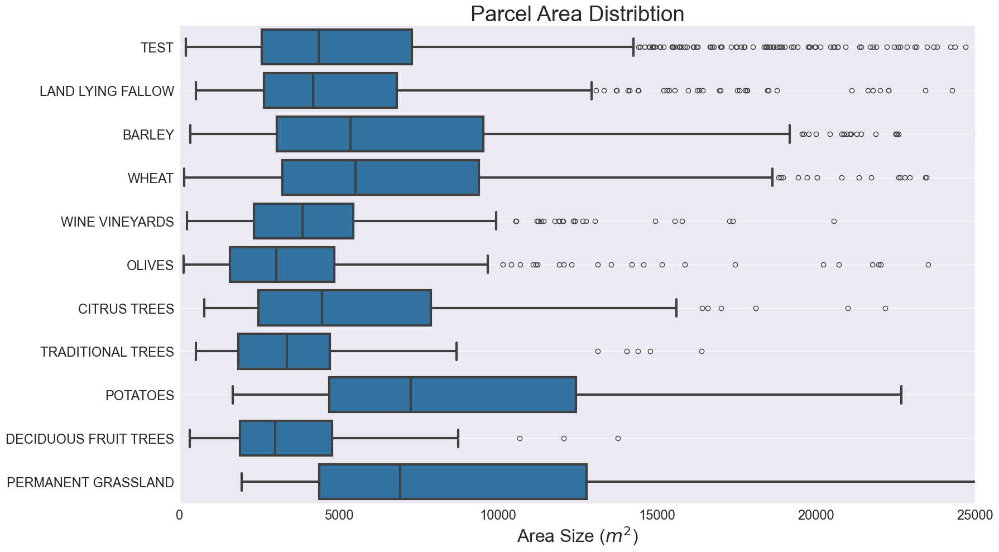

In [9]:
fig = plt.figure(figsize=(18,10))
ax = sns.boxplot(x='AREA',y='CROP_NAME',data=dbf_meta,order = dbf_meta['CROP_NAME'].value_counts().index,linewidth=3)
plt.title('Parcel Area Distribtion',fontsize=28)
plt.xlim(0,25000)
plt.xlabel('Area Size ($m^2$)',fontsize=23)
plt.ylabel('')
plt.tick_params(axis='both', which='major', labelsize=17)
plt.grid()
plt.tight_layout()
plt.show()

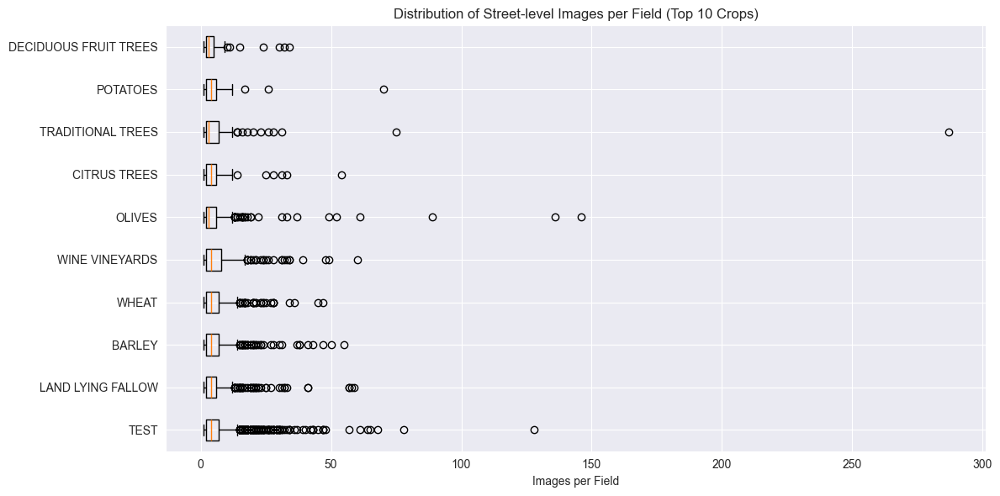

In [39]:
# Distribution per field (top 10 classes)
class_counts = df_meta['CROP_NAME'].value_counts()
top10 = class_counts.index[:10]
data = [df_meta[df_meta['CROP_NAME'] == crop]['N_IMAGES'].values for crop in top10]

plt.figure(figsize=(12, 6))
plt.boxplot(data, labels=top10, vert=False)
plt.xlabel('Images per Field')
plt.title('Distribution of Street-level Images per Field (Top 10 Crops)')
plt.tight_layout()
plt.show()

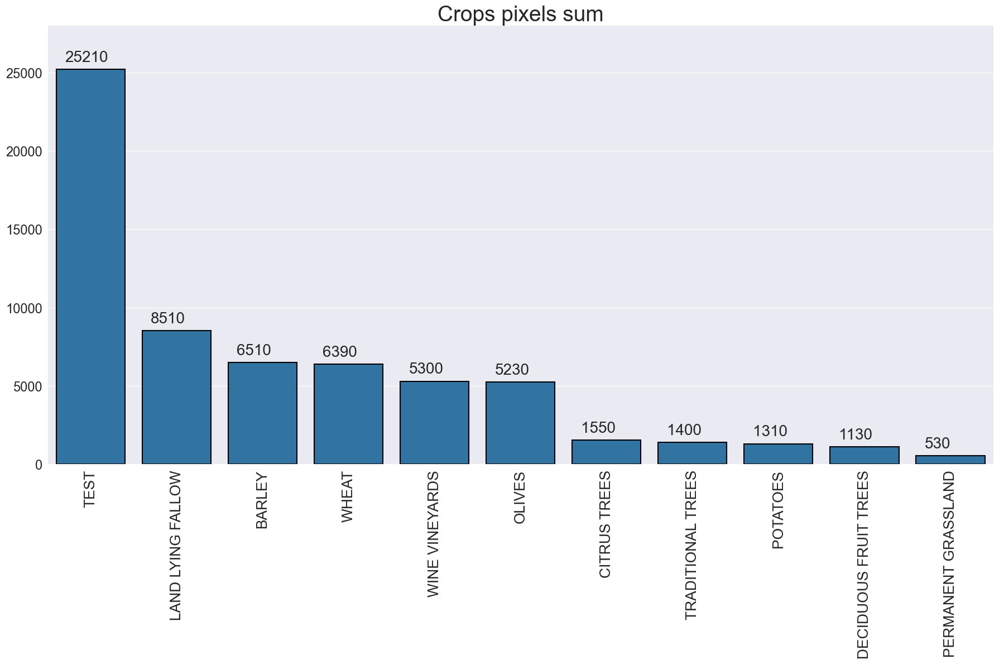

In [10]:
d_count = df_meta.groupby('CROP_NAME').sum()['N_PIXELS'].sort_values(ascending=False).copy()

fig, ax = plt.subplots(figsize=(18, 12))

ax_1 = sns.barplot(y=d_count.values,x=d_count.index,ax=ax,edgecolor="black", linewidth=1.5)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Crops pixels sum',size=28)
ax.tick_params(axis='y', which='major', labelsize=17)
for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+500),
                         size=20, rotation = 0)
ax.set_ylim(0,28000)


ax_1.set_xticklabels(ax_1.get_xticklabels(), rotation=90,size=19)
plt.tight_layout()
plt.show()

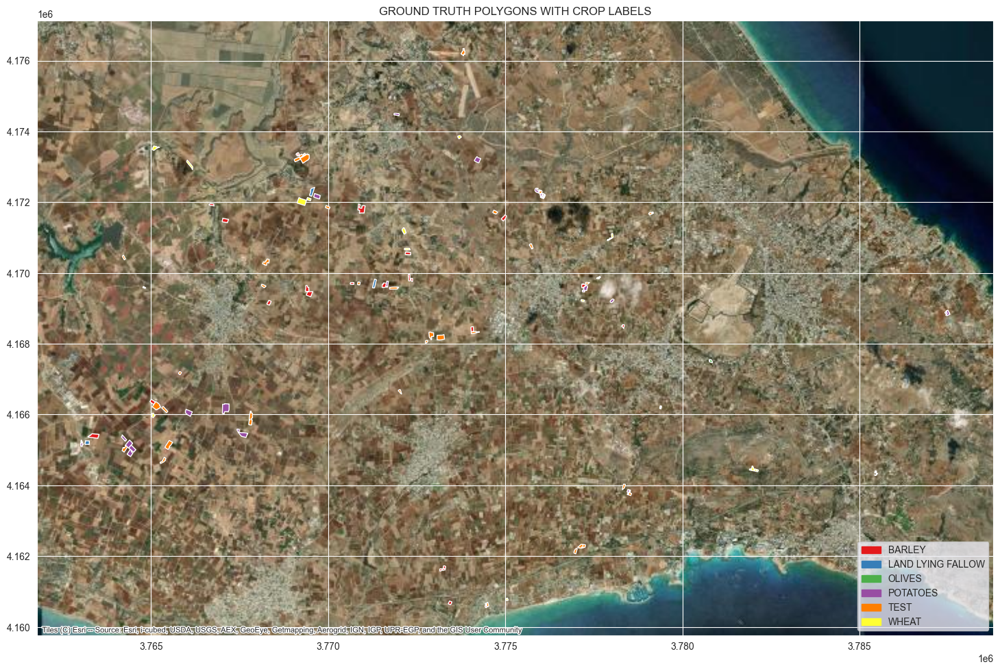

In [11]:
dbf_meta_sample = dbf_meta.iloc[:100].copy()

colors_list = sns.color_palette('Set1',dbf_meta_sample.CROP_NAME.unique().shape[0])

fig, axes = plt.subplots(1,1, figsize=(18, 18))
counter=0
legend_elements = []
for group_1 in dbf_meta_sample[dbf_meta_sample['CROP_NAME'].isin(dbf_meta_sample['CROP_NAME'].value_counts()[:len(colors_list)].index)].groupby('CROP_NAME'):

    group_1[1].plot(ax=axes,color=colors_list[counter],aspect=1)

    legend_elements.append(Patch(facecolor=colors_list[counter], edgecolor=colors_list[counter],label=group_1[0]))
    counter+=1

cx.add_basemap(axes,source=cx.providers.Esri.WorldImagery)
axes.legend(handles=legend_elements,loc='lower right')
axes.title.set_text('GROUND TRUTH POLYGONS WITH CROP LABELS')

In [35]:
import geopandas as gpd
import xyzservices.providers as xyz

# Convert from Web Mercator → geographic (WGS84 lon/lat)
gdf_geo = dbf_meta_sample.to_crs(epsg=4326)

# Now plot normally; hvPlot will project from 4326 → Web Mercator for the tiles
gdf_geo.hvplot(
    geo=True,
    tiles=xyz.Esri.WorldImagery,
    frame_width=900,
    frame_height=600,
    fill_color="CROP_CODE",
    cmap="Viridis",
    hover_cols=list(dbf_meta_sample.columns),
    alpha=0.6,
)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (ID,FIELD_ID,APPLICANT_,CROP_CODE,CROP_NAME,CROP_FAMIL,AREA)

In [13]:
print(dbf_meta_sample.crs)

EPSG:3857


### Sentinel Data

In [14]:
df_sentinel = pd.read_csv('./nasa_data/fs_sentinel_cyprus_2022_buffer5_interp.csv')
print(df_sentinel.shape)
df_sentinel.head()

(63070, 602)


,PIXEL_ID,FIELD_ID,2021-11-01_B02,2021-11-06_B02,2021-11-11_B02,2021-11-16_B02,2021-11-21_B02,2021-11-26_B02,2021-12-01_B02,2021-12-06_B02,...,2022-03-31_VH,2022-04-05_VH,2022-04-10_VH,2022-04-15_VH,2022-04-20_VH,2022-04-25_VH,2022-04-30_VH,2022-05-05_VH,2022-05-10_VH,2022-05-15_VH
0,01014-3101-/2-288-375-11-473-1_1,01014-3101-/2-288-375-11-473-1,1001.5,1008.5,919.0,830.0,740.5,641.5,527.5,413.5,...,-15.781250,-15.781250,-15.781250,-15.781250,-15.781250,-15.781250,-15.781250,-15.781250,-15.781250,-15.781250
1,01014-3101-/2-288-375-11-473-1_2,01014-3101-/2-288-375-11-473-1,871.5,785.5,781.5,777.5,773.5,710.5,559.5,408.5,...,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312
2,01014-3101-/2-288-375-11-473-1_3,01014-3101-/2-288-375-11-473-1,871.5,785.5,781.5,777.5,773.5,710.5,559.5,408.5,...,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312
3,01014-3101-/2-288-375-11-473-1_4,01014-3101-/2-288-375-11-473-1,871.5,785.5,781.5,777.5,773.5,710.5,559.5,408.5,...,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312
4,01014-3101-/2-288-375-11-473-1_5,01014-3101-/2-288-375-11-473-1,871.5,785.5,781.5,777.5,773.5,710.5,559.5,408.5,...,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312,-15.570312


In [15]:
## Sentinel Bands and Vegetation Indices (VIs)
bands = np.array([c.split('_')[1] for c in df_sentinel.filter(regex='2021-11-01',axis=1).columns])
## Dates of Information
dates = np.array([c.split('_')[0] for c in df_sentinel.filter(regex='B02',axis=1).columns])

In [16]:
print(bands)

['B02' 'B03' 'B04' 'B05' 'B06' 'B07' 'B08' 'B8A' 'B11' 'B12' 'NDVI' 'NDWI'
 'PSRI' 'VV' 'VH']


In [17]:
print(dates)

['2021-11-01' '2021-11-06' '2021-11-11' '2021-11-16' '2021-11-21'
 '2021-11-26' '2021-12-01' '2021-12-06' '2021-12-11' '2021-12-16'
 '2021-12-21' '2021-12-26' '2021-12-31' '2022-01-05' '2022-01-10'
 '2022-01-15' '2022-01-20' '2022-01-25' '2022-01-30' '2022-02-04'
 '2022-02-09' '2022-02-14' '2022-02-19' '2022-02-24' '2022-03-01'
 '2022-03-06' '2022-03-11' '2022-03-16' '2022-03-21' '2022-03-26'
 '2022-03-31' '2022-04-05' '2022-04-10' '2022-04-15' '2022-04-20'
 '2022-04-25' '2022-04-30' '2022-05-05' '2022-05-10' '2022-05-15']


In [18]:
## These dictionaries are useful for quickly looking up and matching information
index_to_field_id = {k:v for k,v in df_meta[['ID','FIELD_ID']].values}
field_id_to_index = {k:v for k,v in df_meta[['FIELD_ID','ID']].values}
id_to_code = {k:v for k,v in df_meta[['FIELD_ID','CROP_CODE']].values}
id_to_name = {k:v for k,v in df_meta[['FIELD_ID','CROP_NAME']].values}
id_to_family = {k:v for k,v in df_meta[['FIELD_ID','CROP_FAMILY']].values}
code_to_name = {k:v for k,v in df_meta[['CROP_CODE','CROP_NAME']].values}

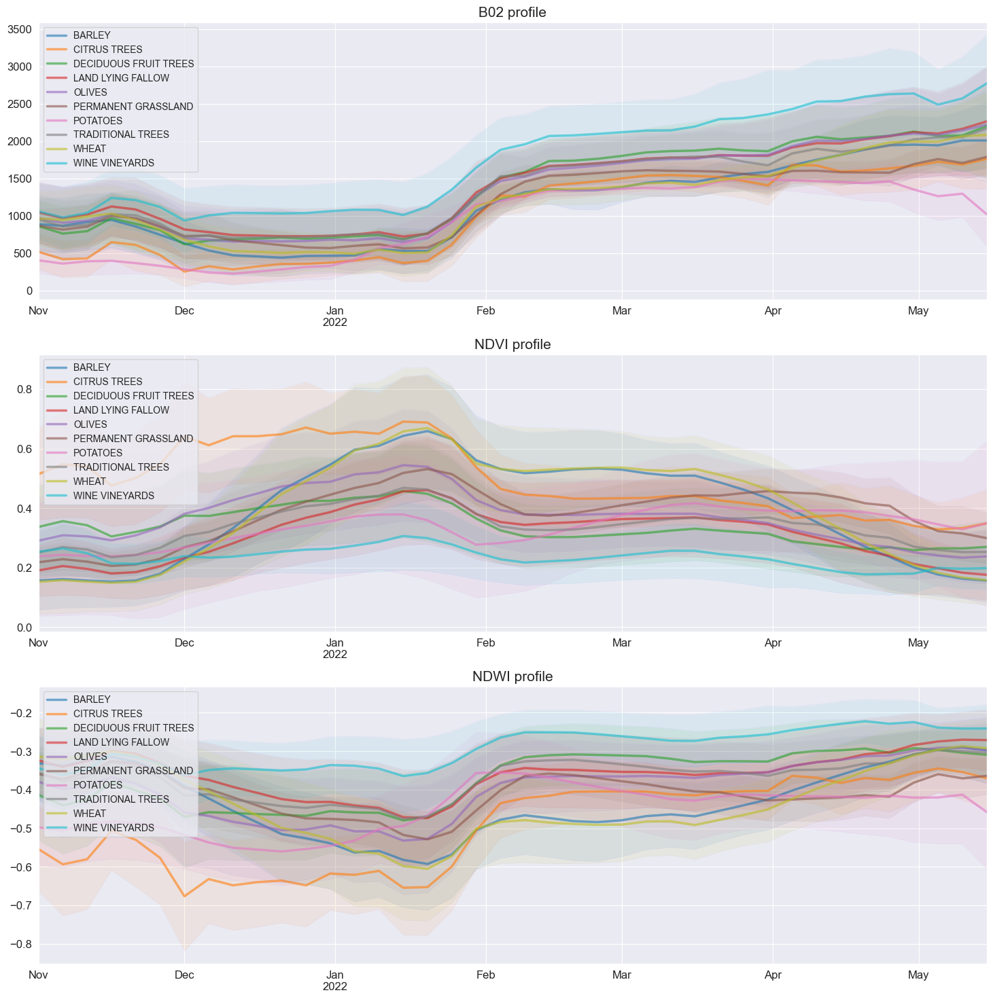

In [19]:
bands_to_visualize = ['B02','NDVI','NDWI']

fig,axes = plt.subplots(len(bands_to_visualize),1,figsize=(18,18))


for n,ax in enumerate(axes):

    mean_band = df_sentinel.iloc[:,1:].groupby('FIELD_ID').mean().filter(regex=bands_to_visualize[n],axis=1)
    mean_band['CROP_NAME'] = mean_band.index.map(id_to_name)
    mean_band = mean_band[mean_band.CROP_NAME!='TEST'].reset_index(drop=True)

    for code in sorted(mean_band['CROP_NAME'].value_counts().index):

        band_case = mean_band[mean_band.CROP_NAME==code].iloc[:,:-1].copy()
        band_case.columns = [pd.to_datetime(x) for x in dates]

        band_case.mean().plot(label=code,lw=2.5,alpha=0.6,ax=ax)
        lower_bound = band_case.mean()-band_case.std()
        upper_bound = band_case.mean()+band_case.std()
        lower_bound.plot(label='',lw=0.5,ls='--',color='b',alpha=0.05,legend=False,ax=ax)
        upper_bound.plot(label='',lw=0.5,ls='--',color='b',alpha=0.05,ax=ax)
        ax.fill_between(x=lower_bound.index, y1=lower_bound, y2 = upper_bound, alpha=0.08,
                        cmap=plt.cm.get_cmap("winter"))
        ax.set_title('{} profile'.format(bands_to_visualize[n]),fontsize=15)
        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.grid('--')
        ax.legend(loc='upper left',fontsize=10)

plt.show()

### Random Forest Classifier

In [20]:
## Feature space pixels aggragation by field

X_train = df_sentinel[df_sentinel['FIELD_ID'].isin(df_meta[df_meta['DATASET']=='TRAIN']['FIELD_ID'])].iloc[:,1:].groupby('FIELD_ID').mean().values
print(X_train.shape)


ids_train = df_sentinel[df_sentinel['FIELD_ID'].isin(df_meta[df_meta['DATASET']=='TRAIN']['FIELD_ID'])].iloc[:,1:].groupby('FIELD_ID').mean().index
print(ids_train.shape)

X_test = df_sentinel[df_sentinel['FIELD_ID'].isin(df_meta[df_meta['DATASET']=='TEST']['FIELD_ID'])].iloc[:,1:].groupby('FIELD_ID').mean().values
print(X_test.shape)

ids_test = df_sentinel[df_sentinel['FIELD_ID'].isin(df_meta[df_meta['DATASET']=='TEST']['FIELD_ID'])].iloc[:,1:].groupby('FIELD_ID').mean().index
print(ids_test.shape)

y_train = df_meta[df_meta['DATASET']=='TRAIN']['CROP_CODE'].values
print(y_train.shape)

(2565, 600)
(2565,)
(1712, 600)
(1712,)
(2565,)


In [21]:
%%time
## Model Fit
clf = RandomForestClassifier(n_estimators=200,random_state=1234)
clf.fit(X_train,y_train)

CPU times: total: 16.7 s
Wall time: 17.1 s


RandomForestClassifier(n_estimators=200, random_state=1234)

In [22]:
## Results Predictions
y_test = clf.predict(X_test)
prob_test = clf.predict_proba(X_test).max(axis=1)

In [23]:
df_results = pd.DataFrame()
df_results['FIELD_ID'] = ids_test
df_results['ID'] = df_results['FIELD_ID'].map(field_id_to_index)
df_results['CROP_CODE'] = y_test.astype(int)
df_results['CROP_NAME'] = df_results['CROP_CODE'].map(code_to_name)
df_results['CONFIDENCE'] = prob_test
print(df_results.shape)
df_results.head()

(1712, 5)


,FIELD_ID,ID,CROP_CODE,CROP_NAME,CONFIDENCE
0,01101-3103-/2-282-372-11-74-1,9,2,BARLEY,0.565
1,01187-3104-/2-280-377-05-261-1,10,2,BARLEY,0.480
2,01225-3100-/2-291-375-07-153-1,11,5,OLIVES,0.345
3,01309-3110-/2-279-381-03-119-1,13,2,BARLEY,0.655
4,01339-3105-/2-280-379-12-286-1,17,2,BARLEY,0.565


In [24]:
# Results Output
df_results[['ID','CROP_CODE']].to_csv('./benchmark_submission.csv',index=False)

In [25]:
street_level_meta = pd.read_csv('./nasa_data/meta/cyrpus_2022_street_level_meta.csv')
print(street_level_meta.shape)
street_level_meta.head()

(25715, 11)


,PHOTO_ID,FIELD_ID,CAPTURED_AT,COMPASS_ANGLE,COMPUTED_COMPASS_ANGLE,COMPUTED_GEOMETRY,THUMB_1024_URL,THUMB_2048_URL,THUMB_ORIGINAL_URL,WIDTH,HEIGHT
0,550954009799519,01014-3101-/2-288-375-11-473-1,2022-05-31 10:16:00,0.0,0.0,"{'type': 'Point', 'coordinates': [33.973642, 3...",https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,2560,1440
1,163131462849398,01014-3101-/2-288-375-11-473-1,2022-05-31 10:16:02,0.0,0.0,"{'type': 'Point', 'coordinates': [33.973441, 3...",https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,2560,1440
2,808899540093076,01014-3101-/2-288-375-11-507-1,2022-05-31 10:15:54,0.0,0.0,"{'type': 'Point', 'coordinates': [33.974178, 3...",https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,2560,1440
3,574767340699898,01014-3101-/2-288-375-11-507-1,2022-05-31 10:15:52,0.0,0.0,"{'type': 'Point', 'coordinates': [33.97435, 35...",https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,2560,1440
4,690113718760723,01014-3101-/2-288-375-11-507-1,2022-05-31 10:15:57,0.0,0.0,"{'type': 'Point', 'coordinates': [33.974002, 3...",https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,https://scontent-lhr8-1.xx.fbcdn.net/m1/v/t6/A...,2560,1440


Predicted Crop: BARLEY



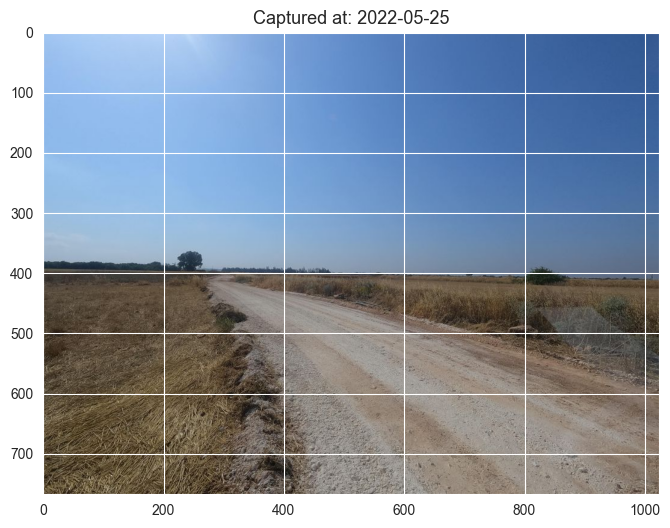

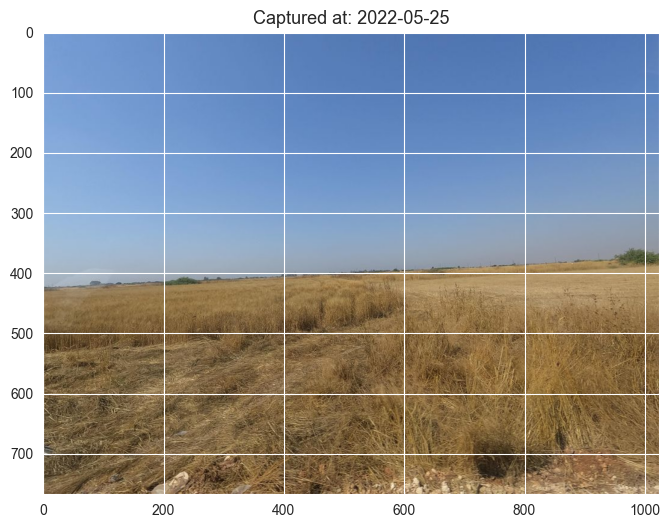

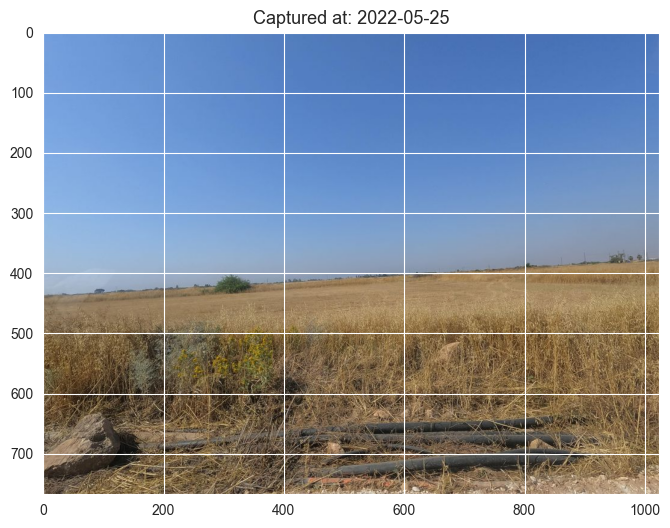

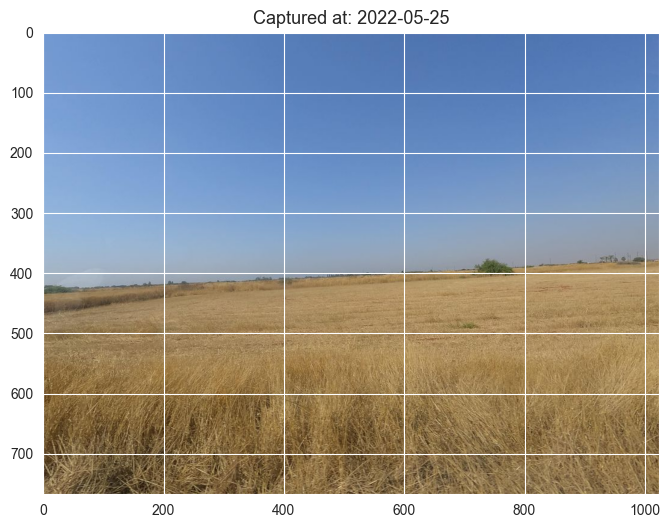

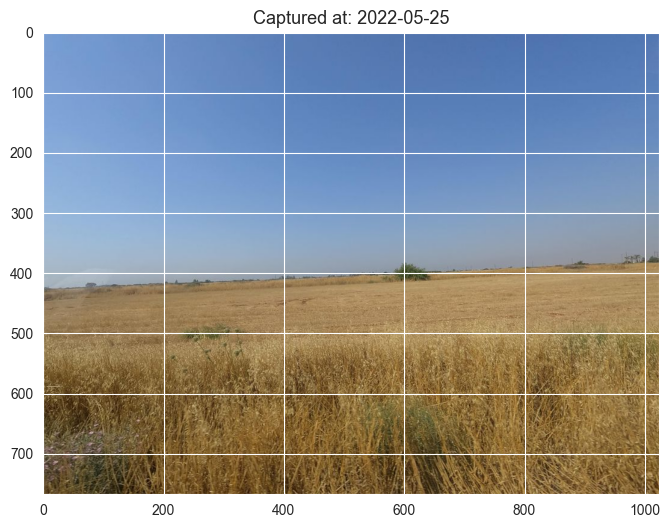

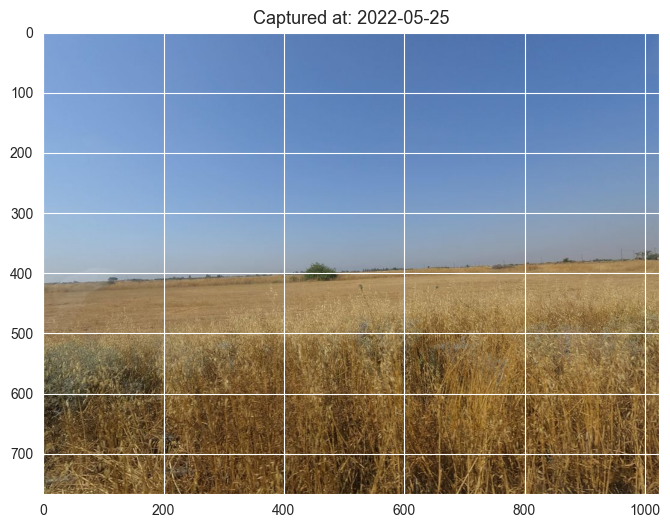

In [26]:
sample_id = 13
sample_pred = df_results[df_results['ID']==sample_id]['CROP_NAME'].values[0]
print('Predicted Crop: {}'.format(sample_pred))
print()


imgs = street_level_meta[street_level_meta['FIELD_ID']==df_results[df_results['ID']==sample_id]['FIELD_ID'].values[0]]

for im,date in imgs[['PHOTO_ID','CAPTURED_AT']].values:
    path = './nasa_data/street_level/{}.jpg'.format(im)
    img = mpimg.imread(path)
    plt.figure(figsize=(16,6))
    plt.title('Captured at: {}'.format(date.split(' ')[0]),size=13)
    plt.imshow(img)

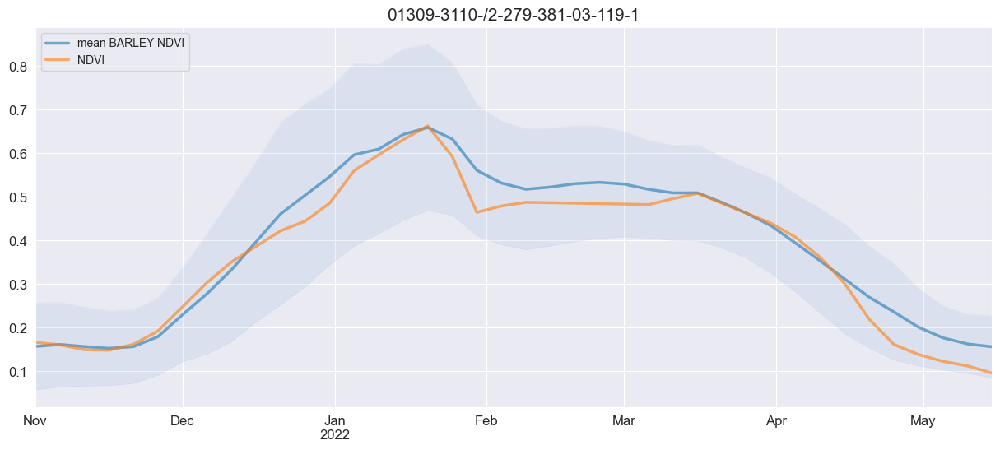

In [27]:
## Average behaviour of the predicted crop vs current instance

mean_ndvi = df_sentinel.iloc[:,1:].groupby('FIELD_ID').mean().filter(regex='NDVI',axis=1)
mean_ndvi['CROP_NAME'] = mean_ndvi.index.map(id_to_name)

fig,ax = plt.subplots(figsize=(15,6))

ndvi_case = mean_ndvi[mean_ndvi.CROP_NAME==sample_pred].iloc[:,:-1].copy()
ndvi_case.columns = [pd.to_datetime(x) for x in dates]
ndvi_case.mean().plot(label='mean {} NDVI'.format(sample_pred),lw=2.5,alpha=0.6,ax=ax)
lower_bound = ndvi_case.mean()-ndvi_case.std()
upper_bound = ndvi_case.mean()+ndvi_case.std()
lower_bound.plot(label='',lw=0.5,ls='--',color='b',alpha=0.05,legend=False,ax=ax)
upper_bound.plot(label='',lw=0.5,ls='--',color='b',alpha=0.05,ax=ax)
ax.fill_between(x=lower_bound.index, y1=lower_bound, y2 = upper_bound, alpha=0.08,
                        cmap=plt.cm.get_cmap("winter"))

sample_case = mean_ndvi.loc[index_to_field_id[sample_id]].iloc[:-1].copy()
sample_case.index = [pd.to_datetime(x) for x in dates]
sample_case.plot(label='NDVI',lw=2.5,alpha=0.6,ax=ax)

ax.set_title('{}'.format(index_to_field_id[sample_id]),fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.grid('--')
ax.legend(loc='upper left',fontsize=10)
plt.show()


### Map Visualization

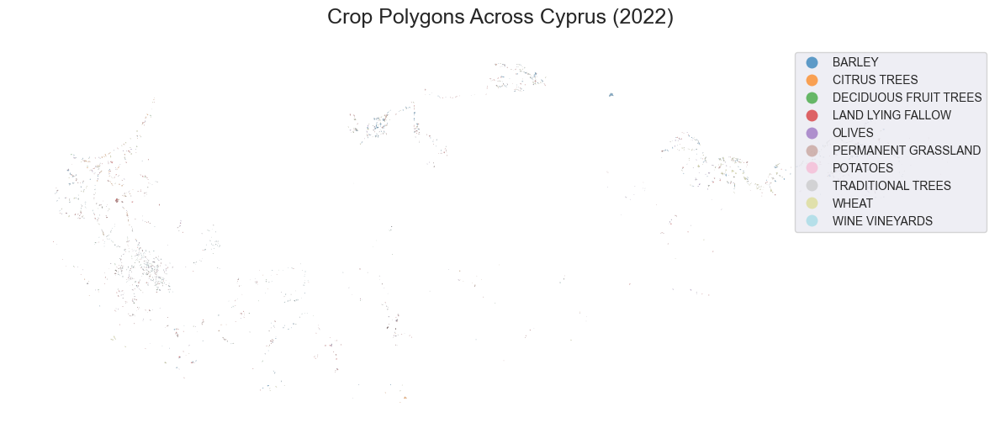

In [40]:
import geopandas as gpd
import matplotlib.pyplot as plt

# ——— Load and prepare the GeoDataFrame ———
# Adjust the path if needed to match your setup
shp_path = './nasa_data/meta/cyprus_2022_meta.shp'
gdf = gpd.read_file(shp_path)

# Reproject to Web Mercator (EPSG:3857) for mapping
gdf = gdf.to_crs(epsg=3857)

# ——— Plot the full map ———
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(
    column='CROP_NAME',       # color by crop
    cmap='tab20',             # categorical colormap
    legend=True,
    linewidth=0.1,
    edgecolor='gray',
    alpha=0.7,
    ax=ax
)

# Optional: add a basemap if you have internet (uncomment)
# import contextily as cx
# cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery)

ax.set_axis_off()
ax.set_title('Crop Polygons Across Cyprus (2022)', fontsize=18, pad=20)
plt.tight_layout()
plt.show()


In [41]:
import hvplot.pandas
import xyzservices.providers as xyz

gdf.to_crs(epsg=4326).hvplot(
    geo=True,
    tiles=xyz.Esri.WorldImagery,
    frame_width=800, frame_height=600,
    color='CROP_CODE',
    cmap='Viridis',
    hover_cols=['FIELD_ID','CROP_NAME'],
    alpha=0.6
)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (CROP_CODE,FIELD_ID,CROP_NAME)